# Proyecto de clustering de segmentación de países por datos socio-económicos

[Curso de Clustering con Python y scikit-learn](https://platzi.com/cursos/clustering)

## Importar librerías

In [181]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as  sns

## Carga de datos

In [182]:
df_mar = pd.read_csv('marketing_campaign.csv',sep='\t')

In [183]:
df_mar

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,...,5,0,0,0,0,0,0,3,11,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,10870,1967,Graduation,Married,61223.0,0,1,13-06-2013,46,709,...,5,0,0,0,0,0,0,3,11,0
2236,4001,1946,PhD,Together,64014.0,2,1,10-06-2014,56,406,...,7,0,0,0,1,0,0,3,11,0
2237,7270,1981,Graduation,Divorced,56981.0,0,0,25-01-2014,91,908,...,6,0,1,0,0,0,0,3,11,0
2238,8235,1956,Master,Together,69245.0,0,1,24-01-2014,8,428,...,3,0,0,0,0,0,0,3,11,0


In [184]:
df_mar.describe()

,ID,Year_Birth,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
count,2240.000000,2240.000000,2216.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,...,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.0,2240.0,2240.000000
mean,5592.159821,1968.805804,52247.251354,0.444196,0.506250,49.109375,303.935714,26.302232,166.950000,37.525446,...,5.316518,0.072768,0.074554,0.072768,0.064286,0.013393,0.009375,3.0,11.0,0.149107
std,3246.662198,11.984069,25173.076661,0.538398,0.544538,28.962453,336.597393,39.773434,225.715373,54.628979,...,2.426645,0.259813,0.262728,0.259813,0.245316,0.114976,0.096391,0.0,0.0,0.356274
min,0.000000,1893.000000,1730.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
25%,2828.250000,1959.000000,35303.000000,0.000000,0.000000,24.000000,23.750000,1.000000,16.000000,3.000000,...,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
50%,5458.500000,1970.000000,51381.500000,0.000000,0.000000,49.000000,173.500000,8.000000,67.000000,12.000000,...,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
75%,8427.750000,1977.000000,68522.000000,1.000000,1.000000,74.000000,504.250000,33.000000,232.000000,50.000000,...,7.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
max,11191.000000,1996.000000,666666.000000,2.000000,2.000000,99.000000,1493.000000,199.000000,1725.000000,259.000000,...,20.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,3.0,11.0,1.000000


## Manejando valores nulos

In [185]:
df_mar.isna().sum()

ID                      0
Year_Birth              0
Education               0
Marital_Status          0
Income                 24
Kidhome                 0
Teenhome                0
Dt_Customer             0
Recency                 0
MntWines                0
MntFruits               0
MntMeatProducts         0
MntFishProducts         0
MntSweetProducts        0
MntGoldProds            0
NumDealsPurchases       0
NumWebPurchases         0
NumCatalogPurchases     0
NumStorePurchases       0
NumWebVisitsMonth       0
AcceptedCmp3            0
AcceptedCmp4            0
AcceptedCmp5            0
AcceptedCmp1            0
AcceptedCmp2            0
Complain                0
Z_CostContact           0
Z_Revenue               0
Response                0
dtype: int64

In [186]:
df_mar.dropna(inplace=True)

In [187]:
df_mar.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2216 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2216 non-null   int64  
 1   Year_Birth           2216 non-null   int64  
 2   Education            2216 non-null   object 
 3   Marital_Status       2216 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2216 non-null   int64  
 6   Teenhome             2216 non-null   int64  
 7   Dt_Customer          2216 non-null   object 
 8   Recency              2216 non-null   int64  
 9   MntWines             2216 non-null   int64  
 10  MntFruits            2216 non-null   int64  
 11  MntMeatProducts      2216 non-null   int64  
 12  MntFishProducts      2216 non-null   int64  
 13  MntSweetProducts     2216 non-null   int64  
 14  MntGoldProds         2216 non-null   int64  
 15  NumDealsPurchases    2216 non-null   i

In [188]:
df_mar_cat=df_mar.select_dtypes(include='object')

In [189]:
df_mar=df_mar.select_dtypes(exclude="object")

In [190]:
import category_encoders as ce
encoder=ce.OrdinalEncoder(cols=df_mar_cat.columns)
df_mar_cat=encoder.fit_transform(df_mar_cat)
df_mar_cat.drop('Dt_Customer',axis=1,inplace=True)

In [191]:
df_mar_cat["ID"]=df_mar["ID"]
df_mar=pd.merge(df_mar,df_mar_cat,how="left",on="ID")

In [192]:
df_mar.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2216 entries, 0 to 2215
Data columns (total 28 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2216 non-null   int64  
 1   Year_Birth           2216 non-null   int64  
 2   Income               2216 non-null   float64
 3   Kidhome              2216 non-null   int64  
 4   Teenhome             2216 non-null   int64  
 5   Recency              2216 non-null   int64  
 6   MntWines             2216 non-null   int64  
 7   MntFruits            2216 non-null   int64  
 8   MntMeatProducts      2216 non-null   int64  
 9   MntFishProducts      2216 non-null   int64  
 10  MntSweetProducts     2216 non-null   int64  
 11  MntGoldProds         2216 non-null   int64  
 12  NumDealsPurchases    2216 non-null   int64  
 13  NumWebPurchases      2216 non-null   int64  
 14  NumCatalogPurchases  2216 non-null   int64  
 15  NumStorePurchases    2216 non-null   i

## Validando duplicados

In [193]:
df_mar[df_mar.duplicated()]

,ID,Year_Birth,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,...,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Education,Marital_Status


## Análisis de distribución

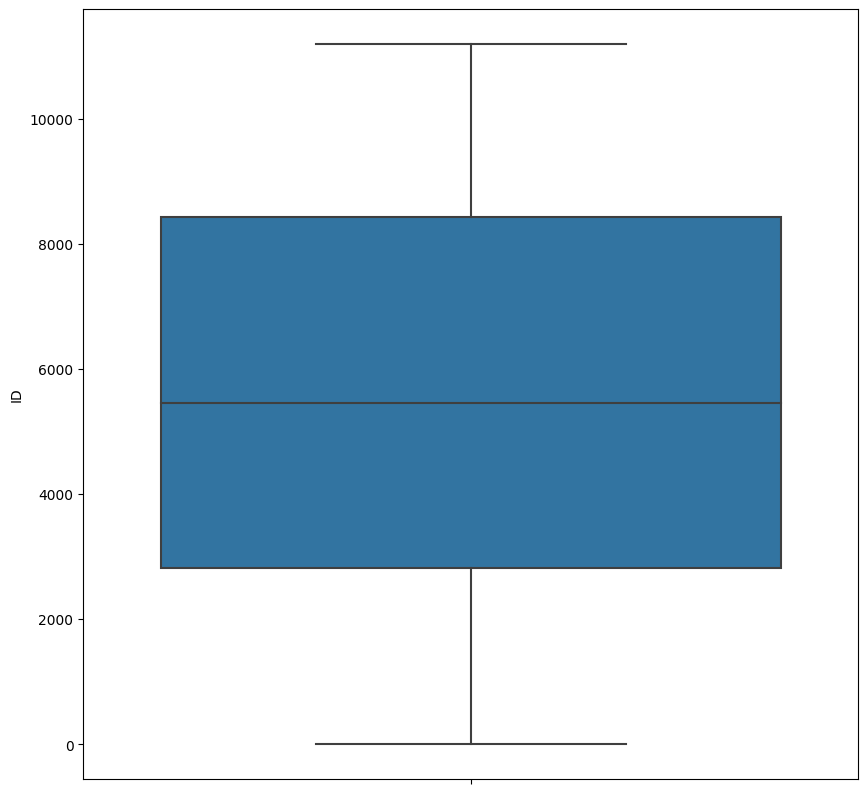

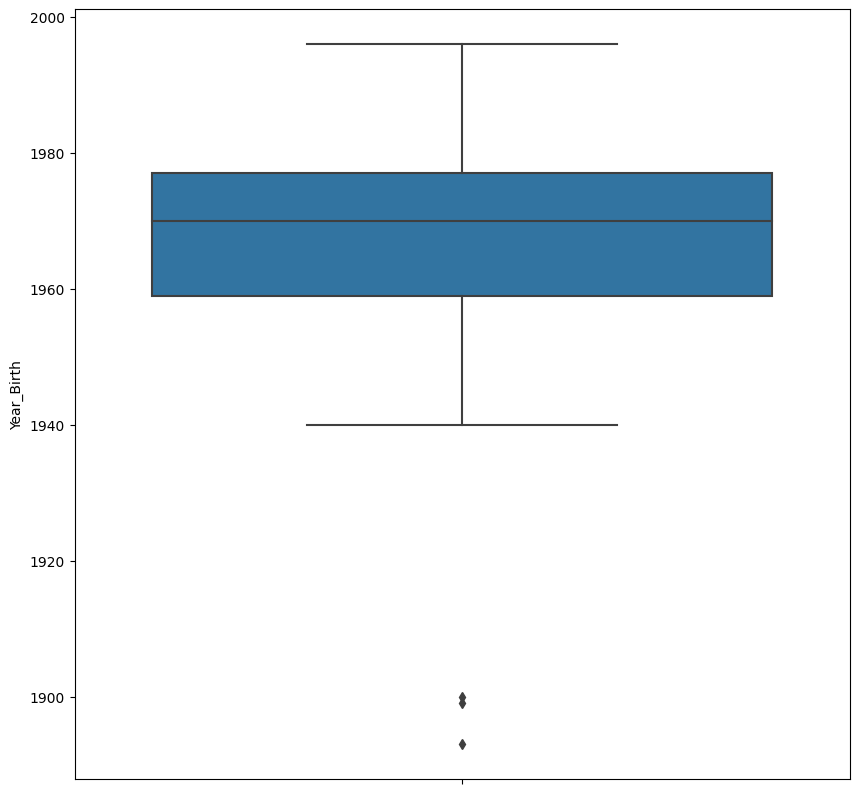

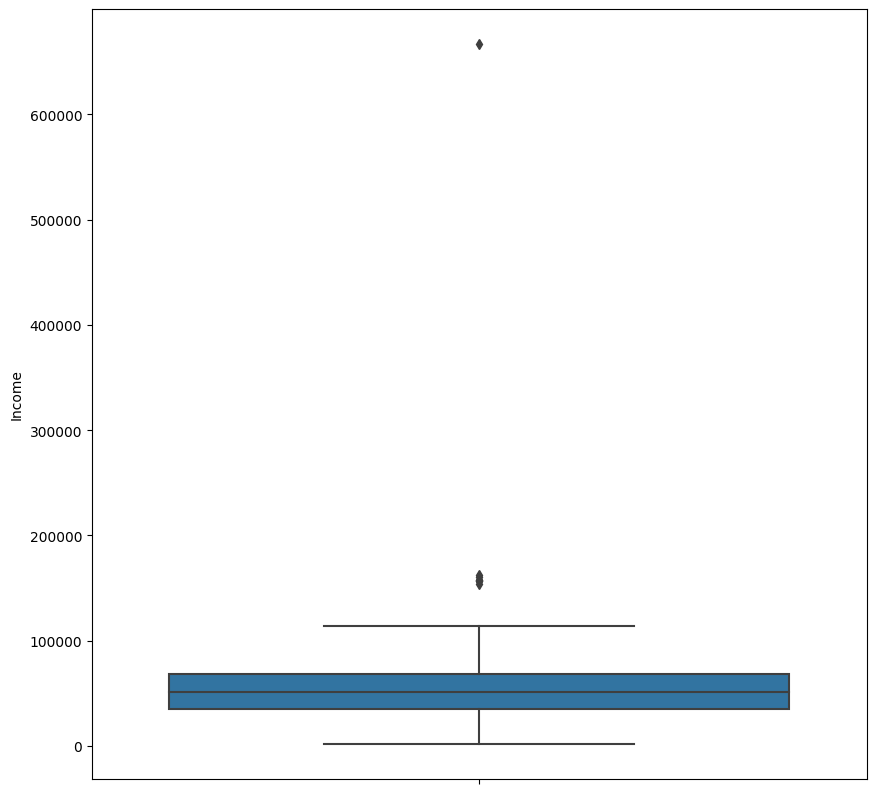

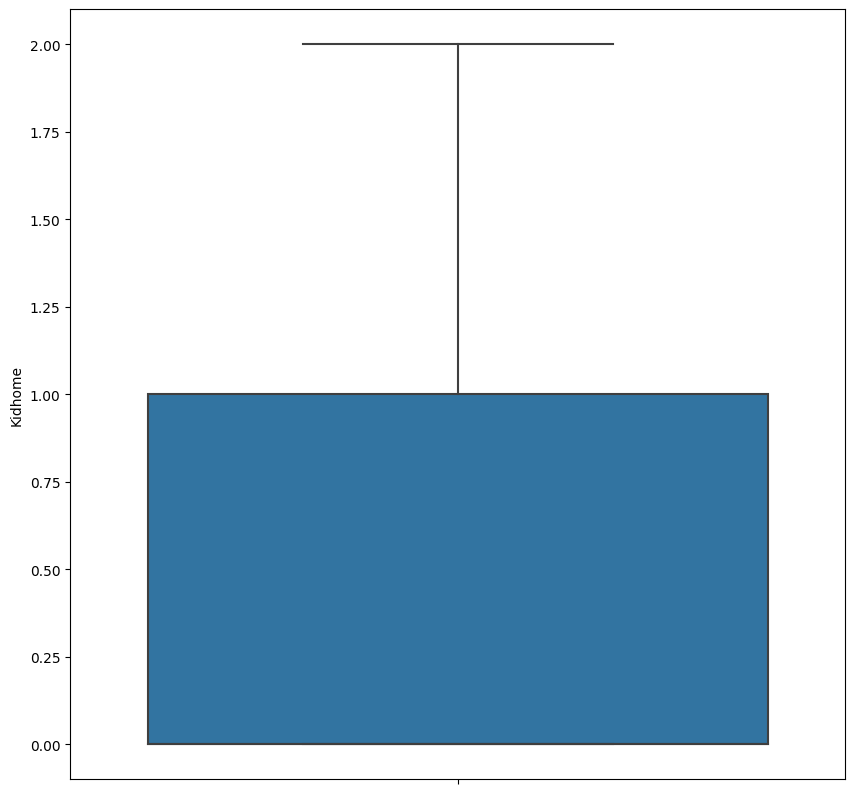

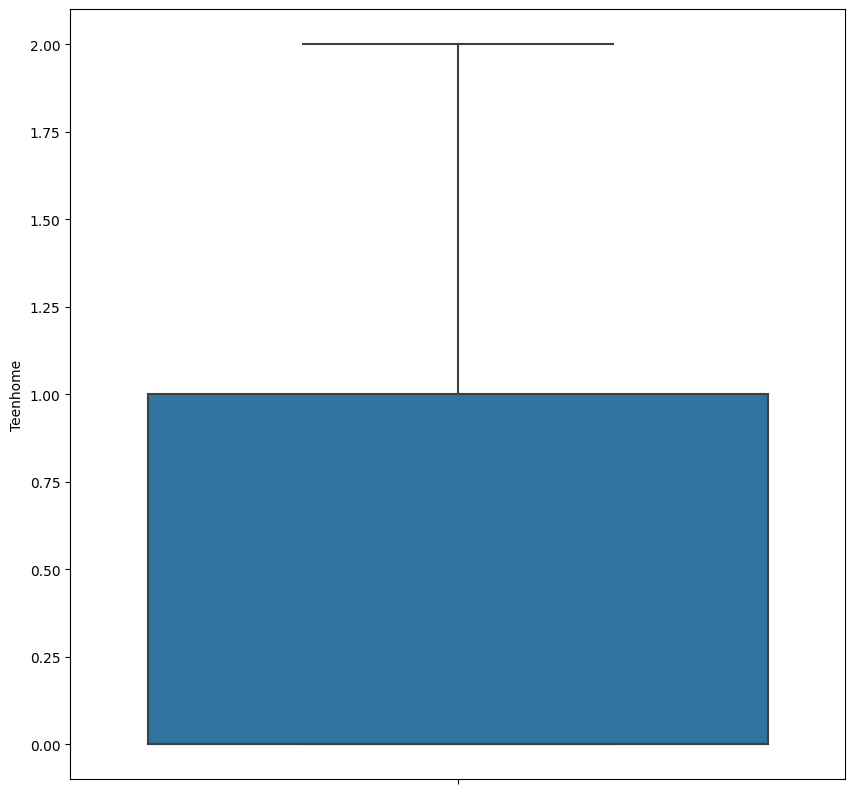

...

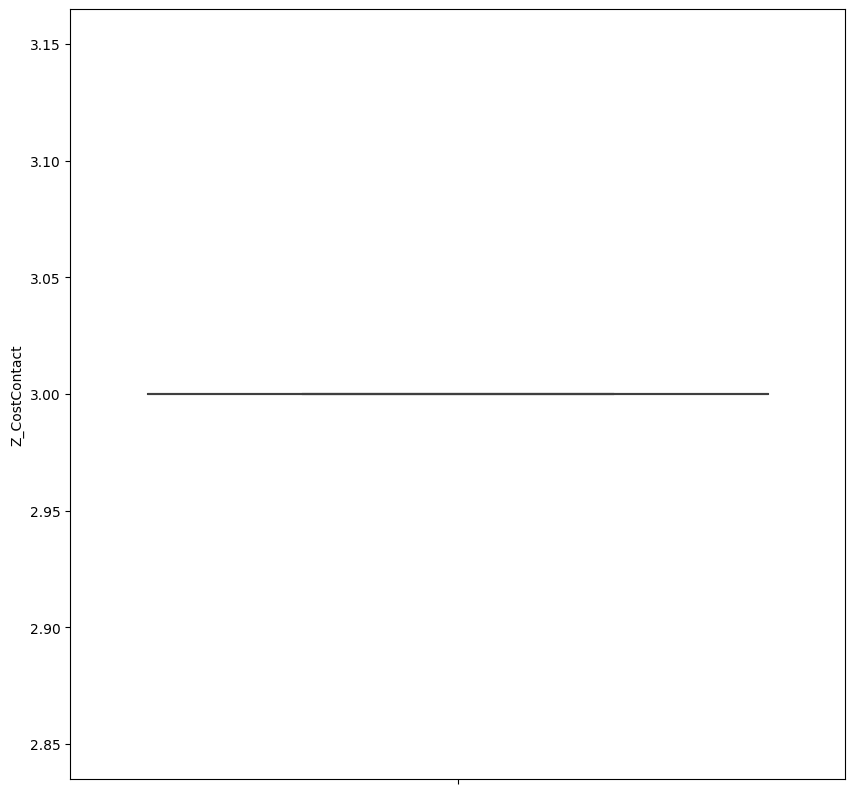

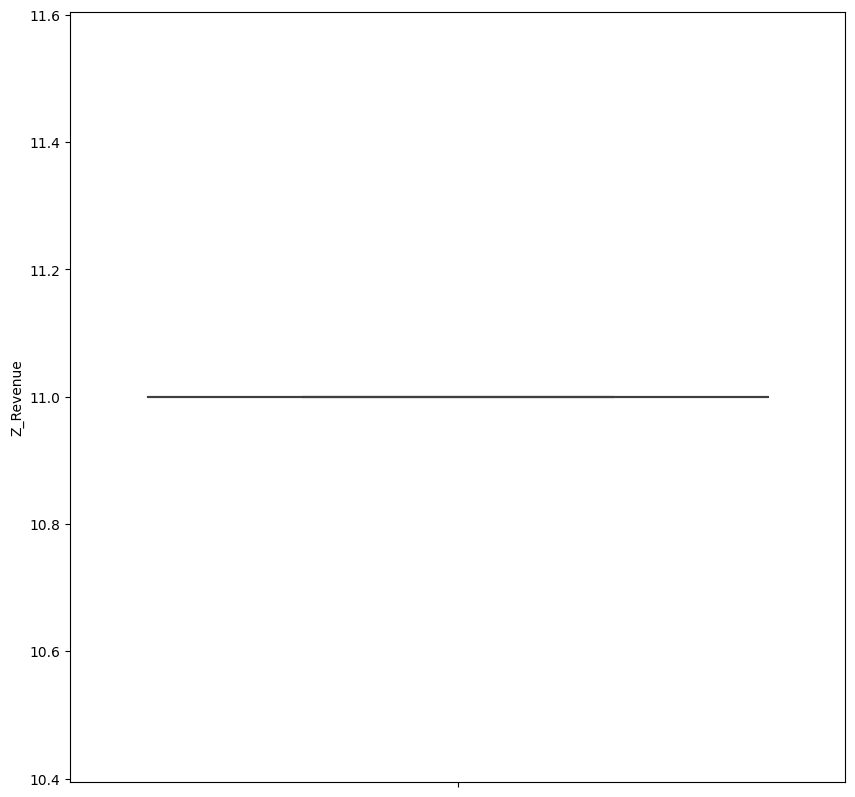

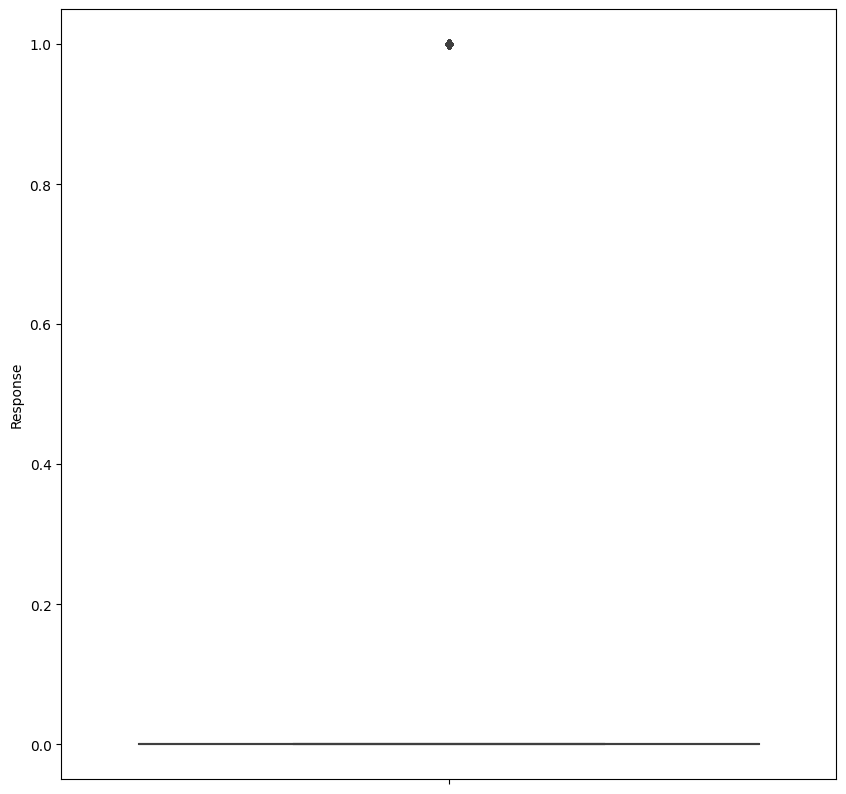

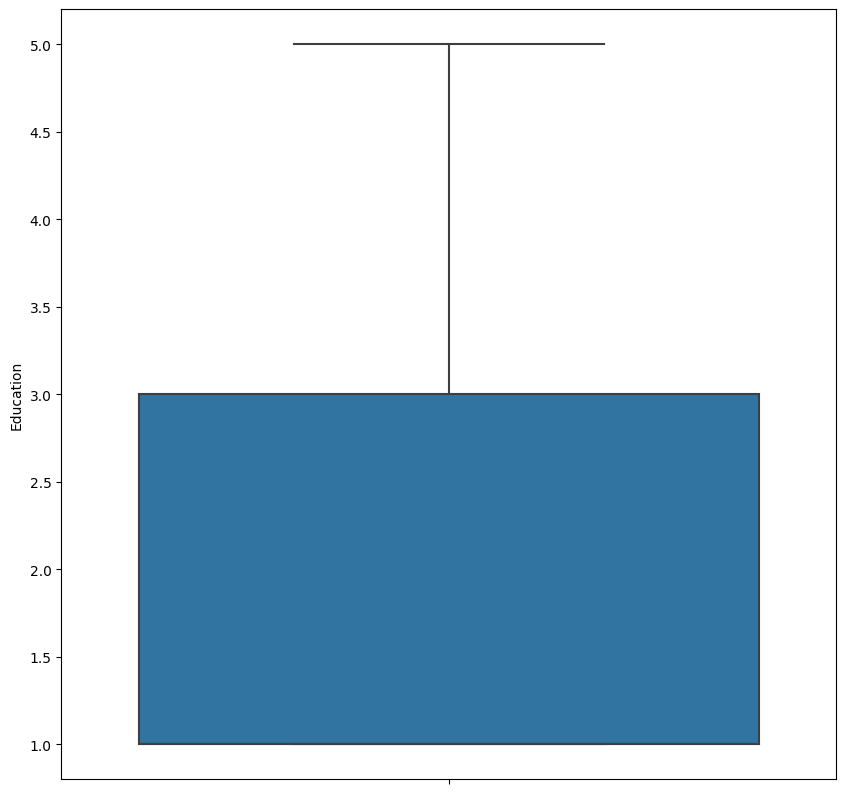

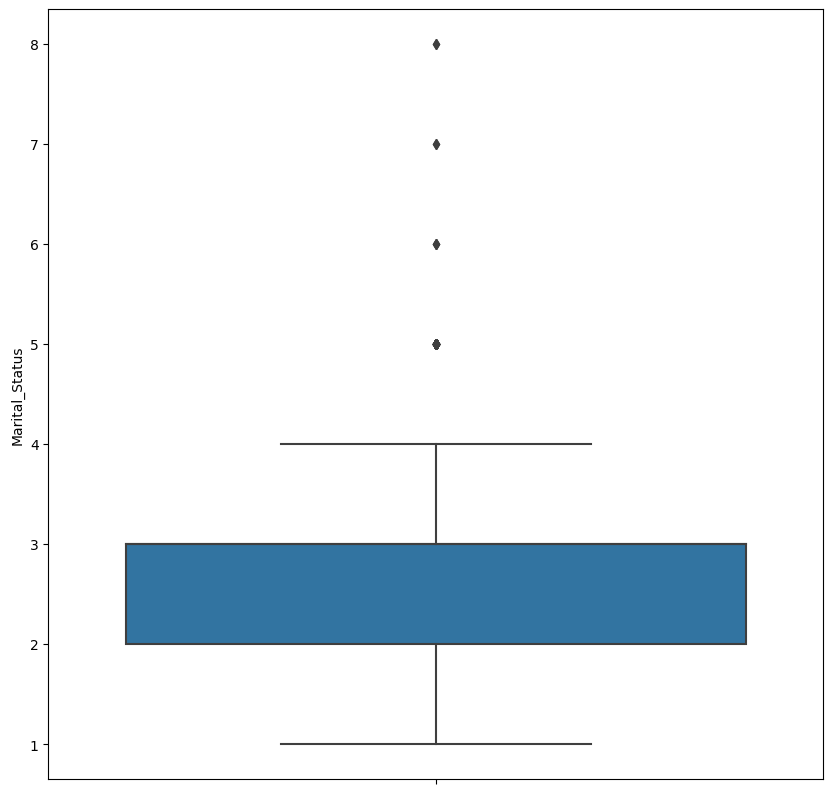

In [194]:
int_cols = df_mar.select_dtypes(exclude='object').columns 
for _ in int_cols:
    plt.figure(figsize=(10,10))
    sns.boxplot(data=df_mar, y= _)
    plt.show()

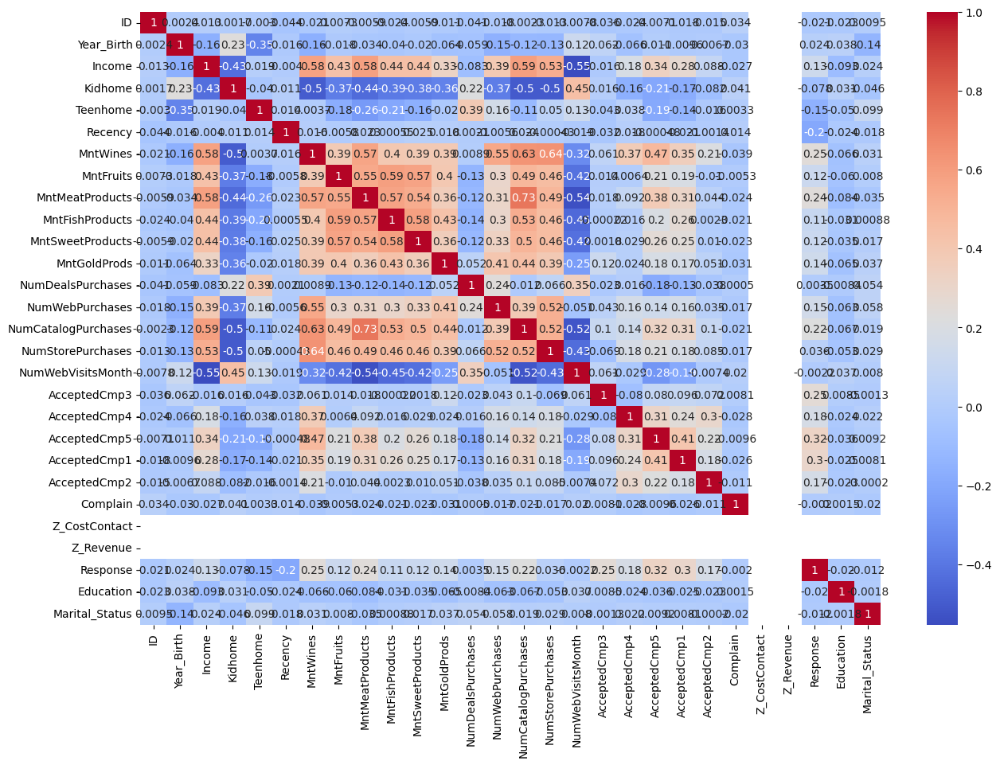

In [195]:
fig = plt.figure(figsize=(15,10))
sns.heatmap(df_mar.corr(), annot=True, cmap='coolwarm')
plt.show()

## Escalar datos

In [196]:
df_mar_original=df_mar.copy()
df_mar.drop("ID",axis=1,inplace=True)
from sklearn.preprocessing import StandardScaler
scaaler = StandardScaler()
df_country_mar = scaaler.fit_transform(df_mar)

In [197]:
df_mar_scaled = pd.DataFrame(df_country_mar, columns = df_mar.columns )

In [198]:
df_mar_scaled

,Year_Birth,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,...,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Education,Marital_Status
0,-0.986443,0.234063,-0.823039,-0.928972,0.310532,0.978226,1.549429,1.690227,2.454568,1.484827,...,-0.282705,-0.280839,-0.261661,-0.117148,-0.097812,0.0,0.0,2.377952,-0.780690,-1.399454
1,-1.236801,-0.234559,1.039938,0.909066,-0.380509,-0.872024,-0.637328,-0.717986,-0.651038,-0.633880,...,-0.282705,-0.280839,-0.261661,-0.117148,-0.097812,0.0,0.0,-0.420530,-0.780690,-1.399454
2,-0.318822,0.769478,-0.823039,-0.928972,-0.795134,0.358511,0.569159,-0.178368,1.340203,-0.146821,...,-0.282705,-0.280839,-0.261661,-0.117148,-0.097812,0.0,0.0,-0.420530,-0.780690,-0.467606
3,1.266777,-1.017239,1.039938,-0.928972,-0.795134,-0.872024,-0.561922,-0.655551,-0.504892,-0.585174,...,-0.282705,-0.280839,-0.261661,-0.117148,-0.097812,0.0,0.0,-0.420530,-0.780690,-0.467606
4,1.016420,0.240221,1.039938,-0.928972,1.554407,-0.391671,0.418348,-0.218505,0.152766,-0.000703,...,-0.282705,-0.280839,-0.261661,-0.117148,-0.097812,0.0,0.0,-0.420530,0.015449,0.464242
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2211,-0.151917,0.356642,-0.823039,0.909066,-0.104093,1.197646,0.418348,0.066913,0.079693,2.215416,...,-0.282705,-0.280839,-0.261661,-0.117148,-0.097812,0.0,0.0,-0.420530,-0.780690,0.464242
2212,-1.904422,0.467539,2.902916,0.909066,0.241428,0.299208,-0.662463,-0.610954,-0.687574,-0.658233,...,-0.282705,-0.280839,3.821732,-0.117148,-0.097812,0.0,0.0,-0.420530,0.015449,-0.467606
2213,1.016420,0.188091,-0.823039,-0.928972,1.450751,1.787710,0.544024,0.223001,-0.102990,-0.365998,...,3.537258,-0.280839,-0.261661,-0.117148,-0.097812,0.0,0.0,-0.420530,-0.780690,1.396090
2214,-1.069896,0.675388,-0.823039,0.909066,-1.417072,0.364441,0.091591,0.209622,0.773887,0.072356,...,-0.282705,-0.280839,-0.261661,-0.117148,-0.097812,0.0,0.0,-0.420530,0.811588,-0.467606


## PCA

In [199]:
from sklearn.decomposition import PCA 

In [200]:
pca = PCA()
pca.fit(df_mar)
pca_data_scaled = pca.transform(df_mar_scaled)
pca_data_scaled

array([[-5.22478412e+04, -1.36526150e+02,  4.85052308e+01, ...,
        -9.54242158e-01,  3.03932834e+00, -1.09891985e+01],
       [-5.22483440e+04, -1.33572996e+02,  4.61994022e+01, ...,
        -9.54016778e-01,  3.03932834e+00, -1.09891985e+01],
       [-5.22473239e+04, -1.35109992e+02,  4.66452091e+01, ...,
        -9.41033296e-01,  3.03932834e+00, -1.09891985e+01],
       ...,
       [-5.22478940e+04, -1.36495234e+02,  4.63496147e+01, ...,
        -9.11230755e-01,  3.03932834e+00, -1.09891985e+01],
       [-5.22474163e+04, -1.35232543e+02,  4.69251749e+01, ...,
        -9.40645293e-01,  3.03932834e+00, -1.09891985e+01],
       [-5.22480816e+04, -1.33879481e+02,  4.63563015e+01, ...,
        -9.61644565e-01,  3.03932834e+00, -1.09891985e+01]])

In [201]:
var = pca.explained_variance_ratio_
print(var)

[9.99814991e-01 1.30140350e-04 4.33617557e-05 4.80762248e-06
 2.58790524e-06 1.44924866e-06 1.32355009e-06 1.08565624e-06
 2.15983540e-07 1.07259616e-08 8.42596435e-09 5.17838425e-09
 4.54566884e-09 2.79222973e-09 2.45143510e-09 1.76621746e-09
 3.26935649e-10 2.25904193e-10 1.85710090e-10 1.08945080e-10
 8.13536857e-11 6.62937919e-11 5.56581260e-11 1.78951359e-11
 1.46997323e-11 9.72043609e-33 9.72043609e-33]


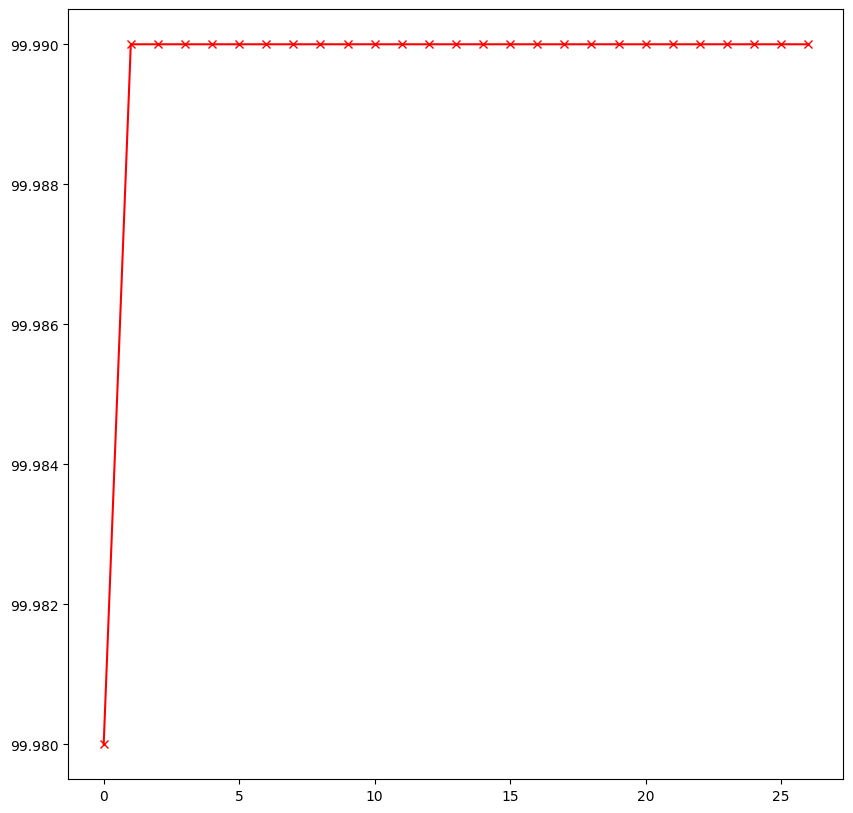

In [202]:
cum_var = np.cumsum(np.round(var, decimals=4)*100) 
plt.figure(figsize=(10,10))
plt.plot(cum_var, 'r-x')
plt.show()

In [203]:
pca_data_standard = pd.DataFrame(pca_data_scaled)
pca_data_standard.drop(list(range(3,27)),axis=1, inplace=True)

In [204]:
pca_data_standard

,0,1,2
0,-52247.841199,-136.526150,48.505231
1,-52248.344045,-133.572996,46.199402
2,-52247.323887,-135.109992,46.645209
3,-52249.126330,-133.607630,46.302862
4,-52247.860903,-134.308019,46.738867
...,...,...,...
2211,-52247.725999,-136.192233,46.711619
2212,-52247.632207,-134.716874,45.866487
2213,-52247.894014,-136.495234,46.349615
2214,-52247.416256,-135.232543,46.925175


## Importar librerías para clustering

In [205]:
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from sklearn.metrics import silhouette_score
from scipy.cluster.hierarchy import dendrogram, linkage

## K-means

### PCA

In [206]:
Sum_of_squared_distances = []
silhouette_scores = []
K = range(2,15) 
for _ in K:
    km = KMeans(n_clusters = _)
    y = km.fit_predict(pca_data_standard)
    Sum_of_squared_distances.append(km.inertia_)
    silhouette_scores.append(silhouette_score(pca_data_standard,y))

/home/sergio/anaconda3/envs/datasc/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/sergio/anaconda3/envs/datasc/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/sergio/anaconda3/envs/datasc/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/sergio/anaconda3/envs/datasc/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the w

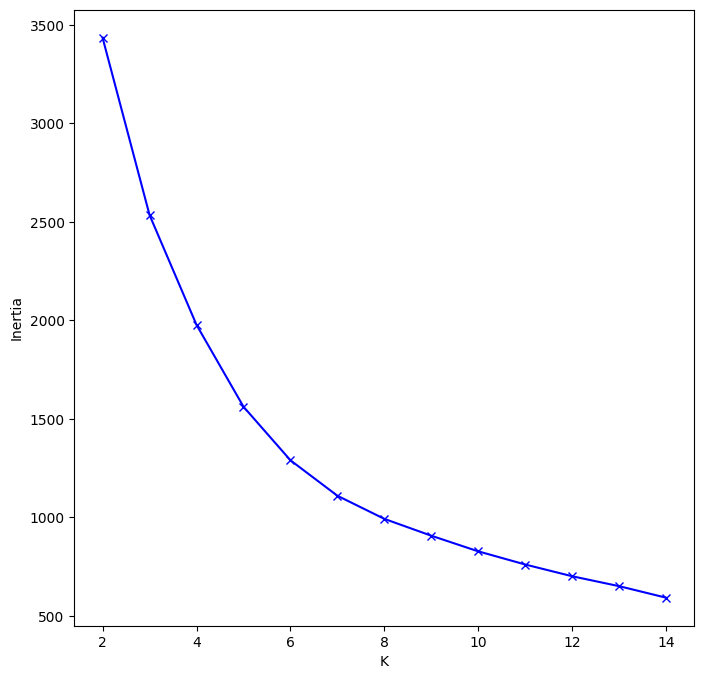

In [207]:
fig = plt.figure(figsize=(8,8))
plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('K')
plt.ylabel('Inertia')
plt.show()

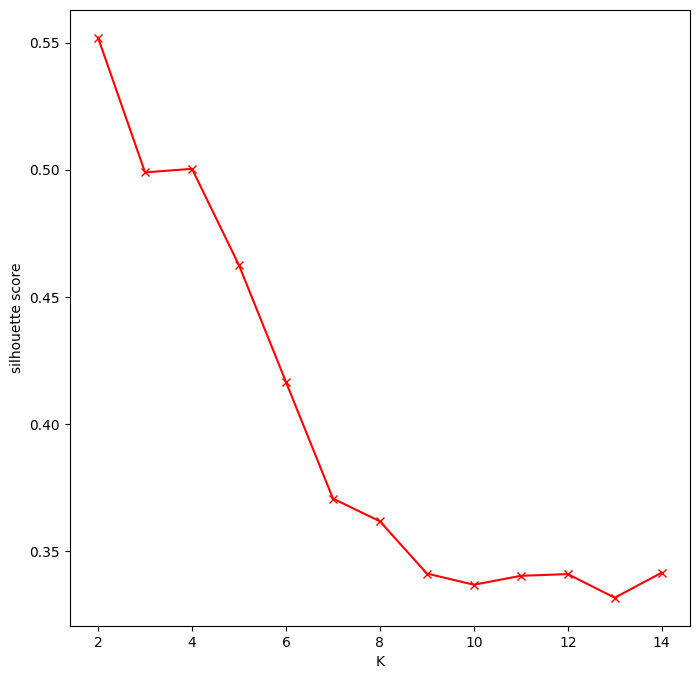

In [208]:
fig = plt.figure(figsize=(8,8))
plt.plot(K, silhouette_scores, 'rx-')
plt.xlabel('K')
plt.ylabel('silhouette score')
plt.show()

In [209]:
km = KMeans(n_clusters = 4)
y = km.fit_predict(pca_data_standard)
print(silhouette_score(pca_data_standard, y))
df_mar_original['k_means_pca'] = y

/home/sergio/anaconda3/envs/datasc/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


0.500345984663534


### Sin PCA

In [210]:
Sum_of_squared_distances = []
silhouette_scores = []
K = range(2,15) 
for _ in K:
    km = KMeans(n_clusters = _)
    y = km.fit_predict(df_mar_scaled)
    Sum_of_squared_distances.append(km.inertia_)
    silhouette_scores.append(silhouette_score(df_mar_scaled,y))

/home/sergio/anaconda3/envs/datasc/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/sergio/anaconda3/envs/datasc/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/sergio/anaconda3/envs/datasc/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/sergio/anaconda3/envs/datasc/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the w

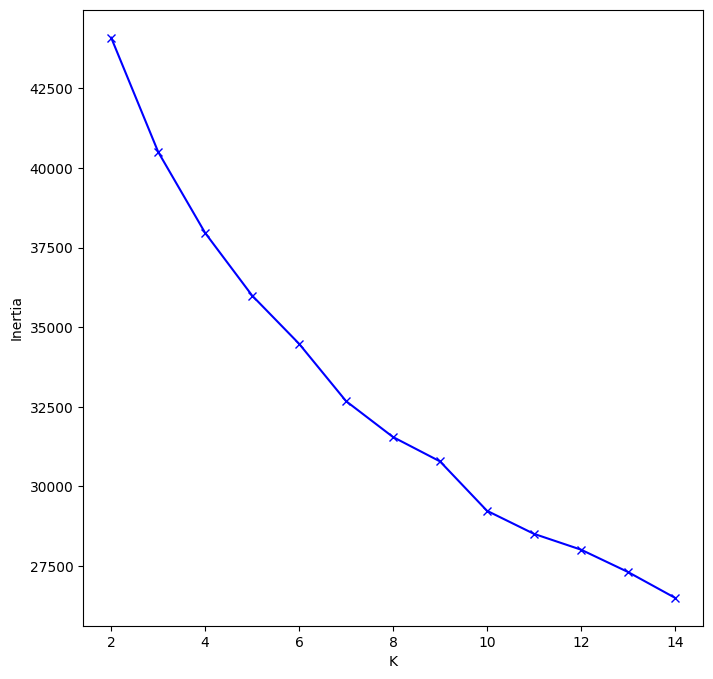

In [211]:
fig = plt.figure(figsize=(8,8))
plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('K')
plt.ylabel('Inertia')
plt.show()

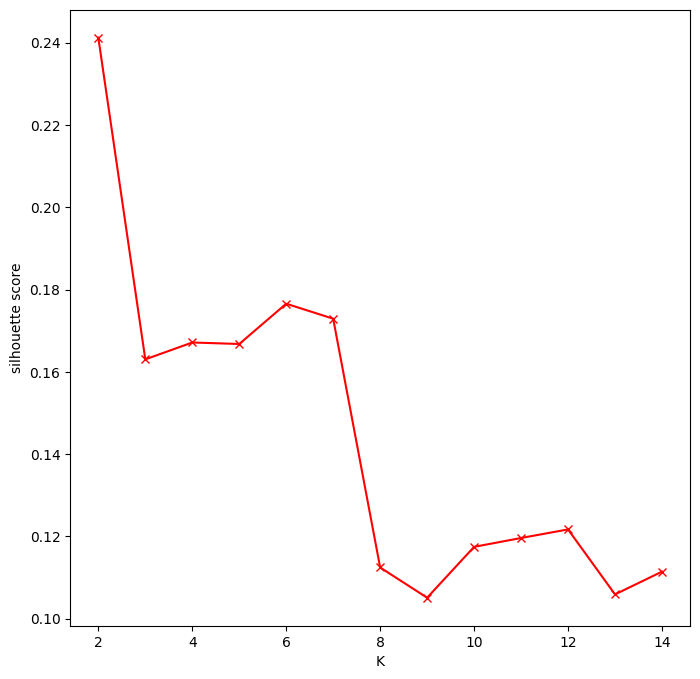

In [212]:
fig = plt.figure(figsize=(8,8))
plt.plot(K, silhouette_scores, 'rx-')
plt.xlabel('K')
plt.ylabel('silhouette score')
plt.show()

In [213]:
km = KMeans(n_clusters = 5)
y = km.fit_predict(df_mar_scaled)
print(silhouette_score(df_mar_scaled, y))
df_mar_original['k_means'] = y

/home/sergio/anaconda3/envs/datasc/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


0.17559654850095102


## Agglomerativen hierarchical clustering

### PCA

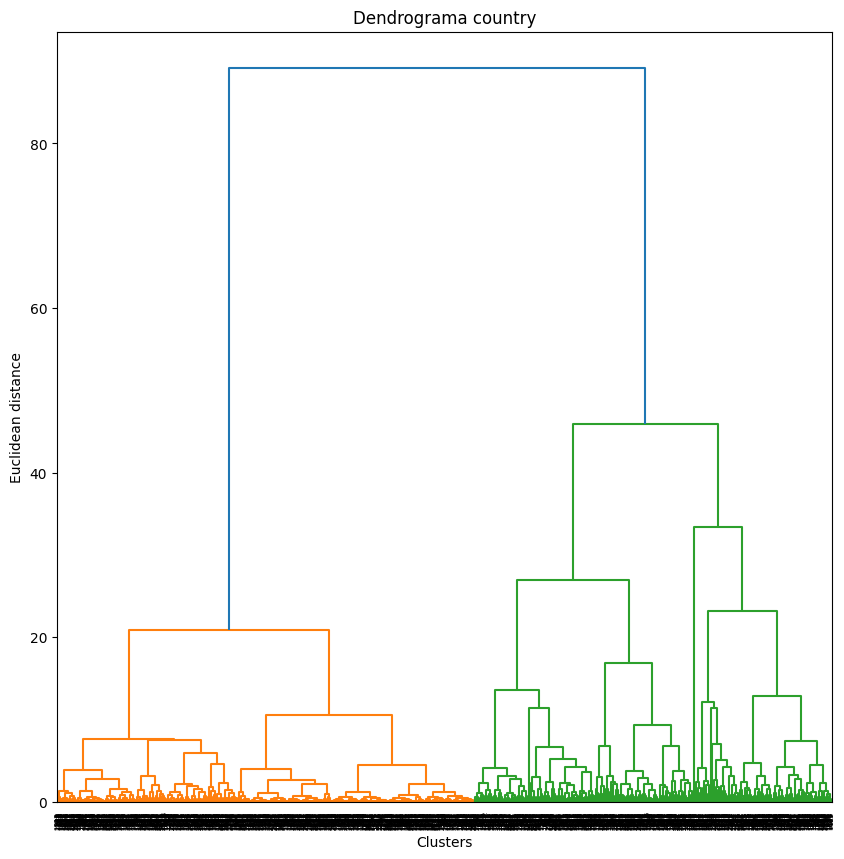

In [214]:
fig = plt.figure(figsize=(10,10))
dendrogram_plot = dendrogram(linkage(pca_data_standard, method='ward'))
plt.title('Dendrograma country')
plt.xlabel('Clusters')
plt.ylabel('Euclidean distance')
plt.show()

In [215]:
hc = AgglomerativeClustering(n_clusters=3, affinity='euclidean', linkage='ward')
y_hc = hc.fit_predict(pca_data_standard)
print(silhouette_score(pca_data_standard,y_hc ))
df_mar_original['hc_pca'] = y_hc

/home/sergio/anaconda3/envs/datasc/lib/python3.9/site-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


0.4804232895602683


### Sin PCA

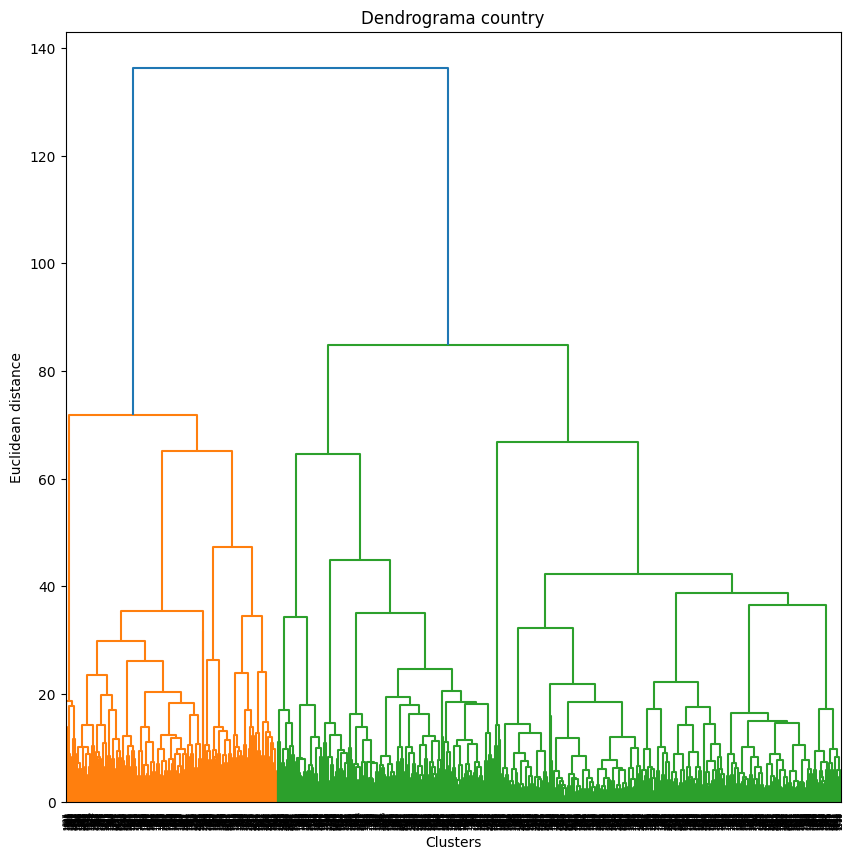

In [216]:
fig = plt.figure(figsize=(10,10))
dendrogram_plot = dendrogram(linkage(df_mar_scaled, method='ward'))
plt.title('Dendrograma country')
plt.xlabel('Clusters')
plt.ylabel('Euclidean distance')
plt.show()

In [218]:
hc = AgglomerativeClustering(n_clusters=4, affinity='euclidean', linkage='ward')
y_hc = hc.fit_predict(df_mar_scaled)
print(silhouette_score(df_mar_scaled,y_hc ))
df_mar_original['hc'] = y_hc

/home/sergio/anaconda3/envs/datasc/lib/python3.9/site-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


0.1446869735769601


## DBSCAN

### PCA

In [219]:
from sklearn.neighbors import NearestNeighbors
neighbors = NearestNeighbors(n_neighbors=2)
neighbors_fit = neighbors.fit(pca_data_standard)
distances, indices = neighbors_fit.kneighbors(pca_data_standard)

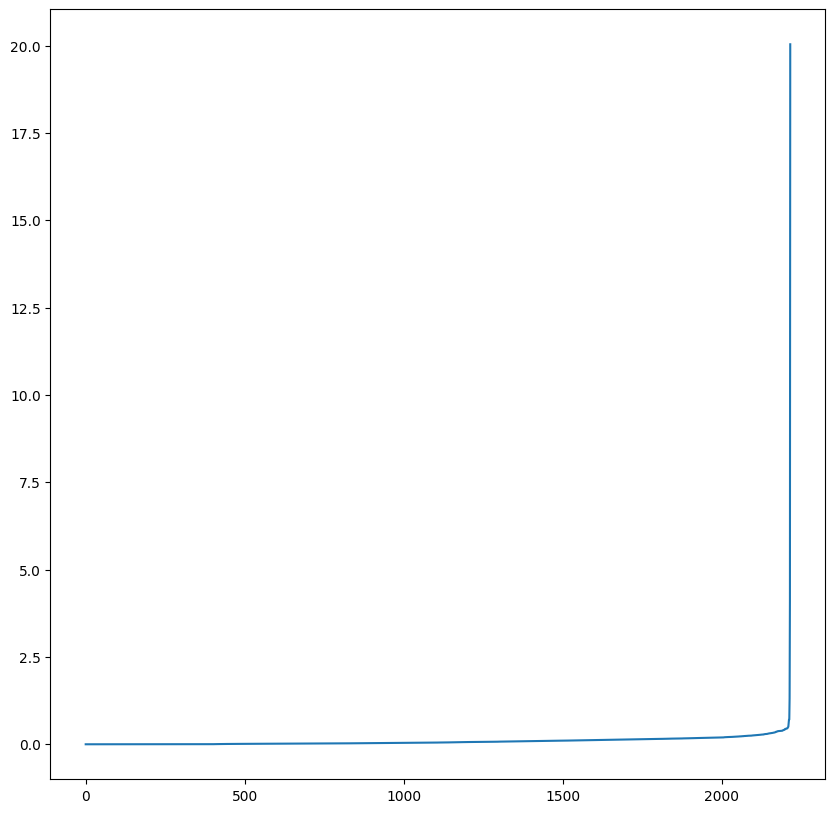

In [220]:
distances = np.sort(distances, axis=0)
distances = distances[:,1]
fig = plt.figure(figsize=(10,10))
plt.plot(distances)

In [221]:
eps_values = np.arange(0.5, 2.0, 0.10)
min_samples = np.arange(3,12)

In [222]:
from itertools import product 
dbscan_paramns = list(product(eps_values,min_samples))
no_of_clusters = []
sil_score = []
for p in dbscan_paramns:
    y_dbscan = DBSCAN(eps=p[0], min_samples=p[1]).fit_predict(pca_data_standard)
    try:
        sil_score.append(silhouette_score(pca_data_standard,y_dbscan))
    except:
        sil_score.append(0)    
    no_of_clusters.append(len(np.unique(y_dbscan)))


In [223]:
df_param_tunning = pd.DataFrame.from_records(dbscan_paramns, columns=['Eps','Min_samples'])
df_param_tunning['sil_score'] = sil_score
df_param_tunning['n_clusters'] = no_of_clusters

In [224]:
pivot_1 = pd.pivot_table(df_param_tunning, values='sil_score', columns='Eps', index='Min_samples')
pivot_2 = pd.pivot_table(df_param_tunning, values='n_clusters', columns='Eps', index='Min_samples')

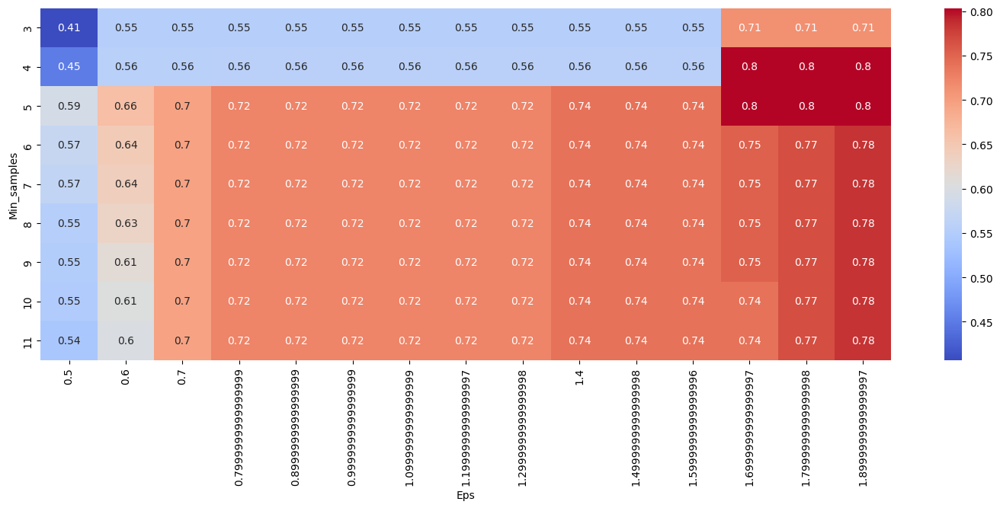

In [225]:
fig, ax = plt.subplots(figsize=(18,6))
sns.heatmap(pivot_1, annot=True, annot_kws={'size':10}, cmap='coolwarm', ax=ax)
plt.show()

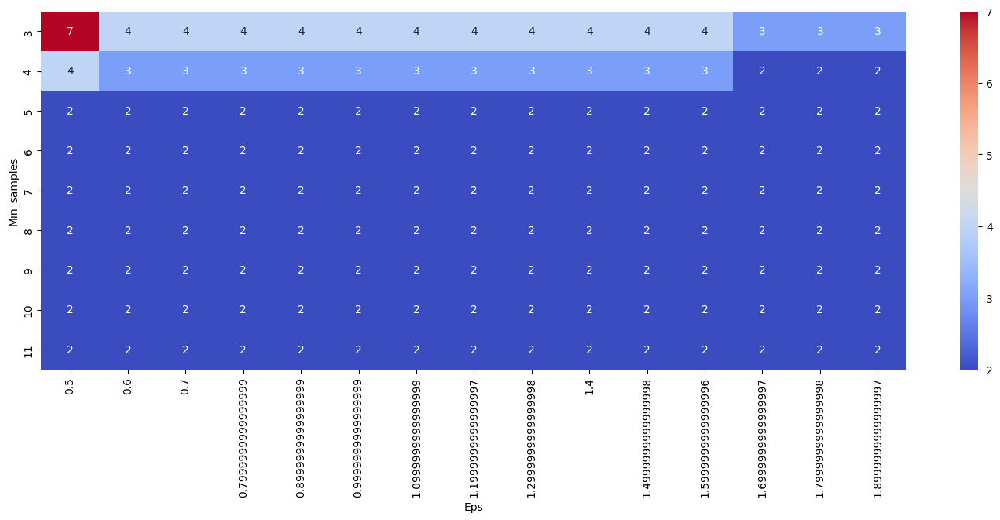

In [226]:
fig, ax = plt.subplots(figsize=(18,6))
sns.heatmap(pivot_2, annot=True, annot_kws={'size':10}, cmap='coolwarm', ax=ax)
plt.show()

In [228]:
dbscan_train = DBSCAN(eps=1.6, min_samples=3)
y_dbscan = dbscan_train.fit_predict(pca_data_standard)
print(silhouette_score(pca_data_standard,y_dbscan ))
df_mar_original['dbscan_pca'] = y_dbscan

0.553218065505246


### Sin PCA

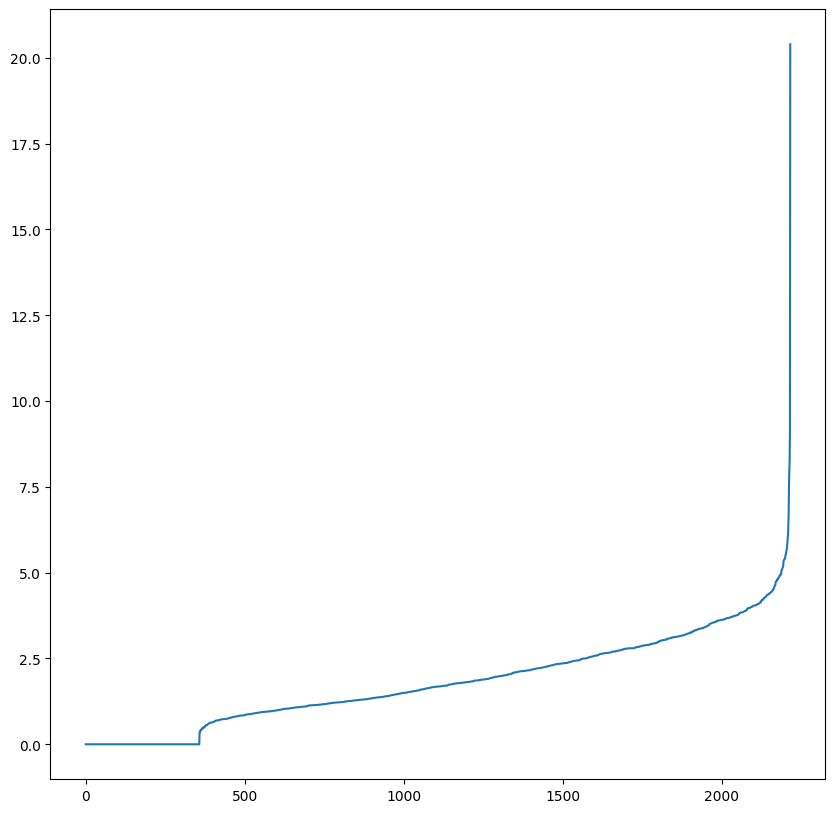

In [229]:
neighbors = NearestNeighbors(n_neighbors=2)
neighbors_fit = neighbors.fit(df_mar_scaled)
distances, indices = neighbors_fit.kneighbors(df_mar_scaled)

distances = np.sort(distances, axis=0)
distances = distances[:,1]
fig = plt.figure(figsize=(10,10))
plt.plot(distances)

In [230]:
eps_values = np.arange(2.5, 5, 0.10)
min_samples = np.arange(3,12)

In [231]:
from itertools import product 
dbscan_paramns = list(product(eps_values,min_samples))
no_of_clusters = []
sil_score = []
for p in dbscan_paramns:
    y_dbscan = DBSCAN(eps=p[0], min_samples=p[1]).fit_predict(df_mar_scaled)
    try:
        sil_score.append(silhouette_score(df_mar_scaled,y_dbscan))
    except:
        sil_score.append(0)    
    no_of_clusters.append(len(np.unique(y_dbscan)))

In [232]:
df_param_tunning = pd.DataFrame.from_records(dbscan_paramns, columns=['Eps','Min_samples'])
df_param_tunning['sil_score'] = sil_score
df_param_tunning['n_clusters'] = no_of_clusters

In [233]:
pivot_1 = pd.pivot_table(df_param_tunning, values='sil_score', columns='Eps', index='Min_samples')
pivot_2 = pd.pivot_table(df_param_tunning, values='n_clusters', columns='Eps', index='Min_samples')

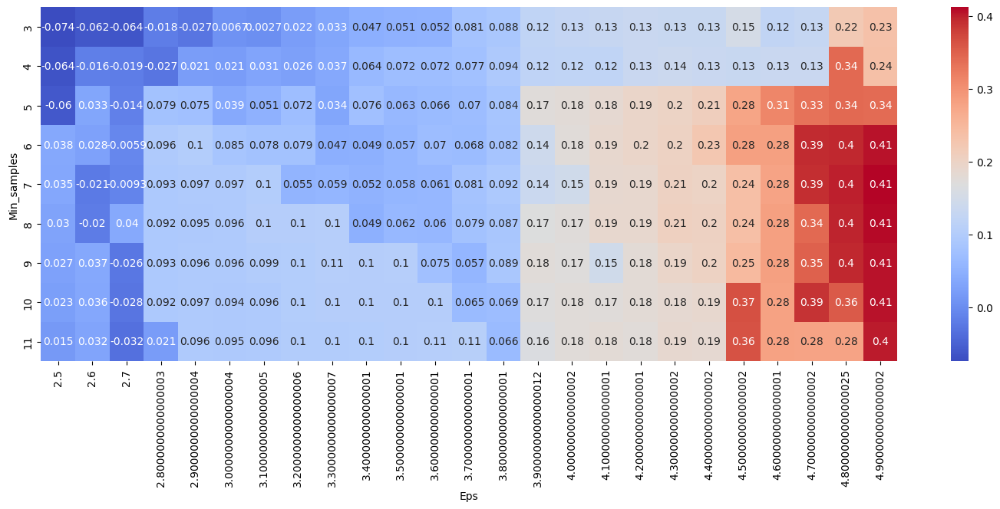

In [234]:
fig, ax = plt.subplots(figsize=(18,6))
sns.heatmap(pivot_1, annot=True, annot_kws={'size':10}, cmap='coolwarm', ax=ax)
plt.show()

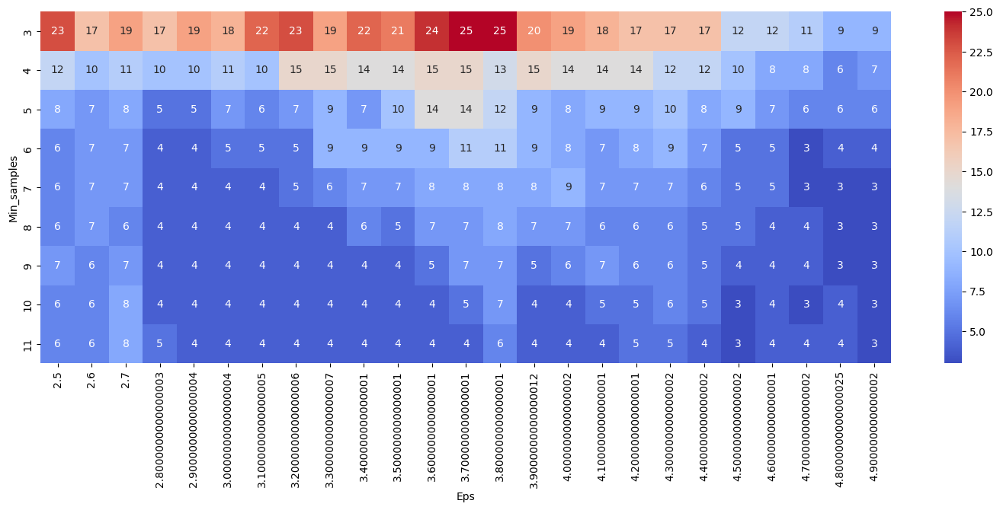

In [235]:
fig, ax = plt.subplots(figsize=(18,6))
sns.heatmap(pivot_2, annot=True, annot_kws={'size':10}, cmap='coolwarm', ax=ax)
plt.show()

In [236]:
dbscan_train = DBSCAN(eps=5, min_samples=3)
y_dbscan = dbscan_train.fit_predict(df_mar_scaled)
print(silhouette_score(df_mar_scaled,y_dbscan ))
df_mar_original['dbscan_cluster'] = y_dbscan

0.2357964477853004


In [237]:
df_mar_original

,ID,Year_Birth,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,...,Z_Revenue,Response,Education,Marital_Status,k_means_pca,k_means,hc_pca,hc,dbscan_pca,dbscan_cluster
0,5524,1957,58138.0,0,0,58,635,88,546,172,...,11,1,1,1,3,1,0,1,0,0
1,2174,1954,46344.0,1,1,38,11,1,6,2,...,11,0,1,1,0,4,1,0,0,0
2,4141,1965,71613.0,0,0,26,426,49,127,111,...,11,0,1,2,1,1,2,1,0,0
3,6182,1984,26646.0,1,0,26,11,4,20,10,...,11,0,1,2,0,4,1,0,0,0
4,5324,1981,58293.0,1,0,94,173,43,118,46,...,11,0,2,3,0,4,1,2,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2211,10870,1967,61223.0,0,1,46,709,43,182,42,...,11,0,1,3,1,0,2,2,0,0
2212,4001,1946,64014.0,2,1,56,406,0,30,0,...,11,0,2,2,1,0,2,1,0,0
2213,7270,1981,56981.0,0,0,91,908,48,217,32,...,11,0,1,4,1,0,2,2,0,0
2214,8235,1956,69245.0,0,1,8,428,30,214,80,...,11,0,3,2,1,0,2,2,0,0


## Evaluación de resultados

In [238]:
df_mar_original.columns

Index(['ID', 'Year_Birth', 'Income', 'Kidhome', 'Teenhome', 'Recency',
       'MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts',
       'MntSweetProducts', 'MntGoldProds', 'NumDealsPurchases',
       'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases',
       'NumWebVisitsMonth', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5',
       'AcceptedCmp1', 'AcceptedCmp2', 'Complain', 'Z_CostContact',
       'Z_Revenue', 'Response', 'Education', 'Marital_Status', 'k_means_pca',
       'k_means', 'hc_pca', 'hc', 'dbscan_pca', 'dbscan_cluster'],
      dtype='object')

In [239]:
df_mar_original[['Year_Birth', 'Income', 'Kidhome', 'Teenhome', 'Recency',
       'MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts',
       'MntSweetProducts', 'MntGoldProds', 'NumDealsPurchases',
       'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases',
       'NumWebVisitsMonth', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5',
       'AcceptedCmp1', 'AcceptedCmp2', 'Complain', 'Z_CostContact',
       'Z_Revenue', 'Response', 'Education', 'Marital_Status','hc_pca']]

,Year_Birth,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,...,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Education,Marital_Status,hc_pca
0,1957,58138.0,0,0,58,635,88,546,172,88,...,0,0,0,0,3,11,1,1,1,0
1,1954,46344.0,1,1,38,11,1,6,2,1,...,0,0,0,0,3,11,0,1,1,1
2,1965,71613.0,0,0,26,426,49,127,111,21,...,0,0,0,0,3,11,0,1,2,2
3,1984,26646.0,1,0,26,11,4,20,10,3,...,0,0,0,0,3,11,0,1,2,1
4,1981,58293.0,1,0,94,173,43,118,46,27,...,0,0,0,0,3,11,0,2,3,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2211,1967,61223.0,0,1,46,709,43,182,42,118,...,0,0,0,0,3,11,0,1,3,2
2212,1946,64014.0,2,1,56,406,0,30,0,0,...,0,1,0,0,3,11,0,2,2,2
2213,1981,56981.0,0,0,91,908,48,217,32,12,...,0,0,0,0,3,11,0,1,4,2
2214,1956,69245.0,0,1,8,428,30,214,80,30,...,0,0,0,0,3,11,0,3,2,2


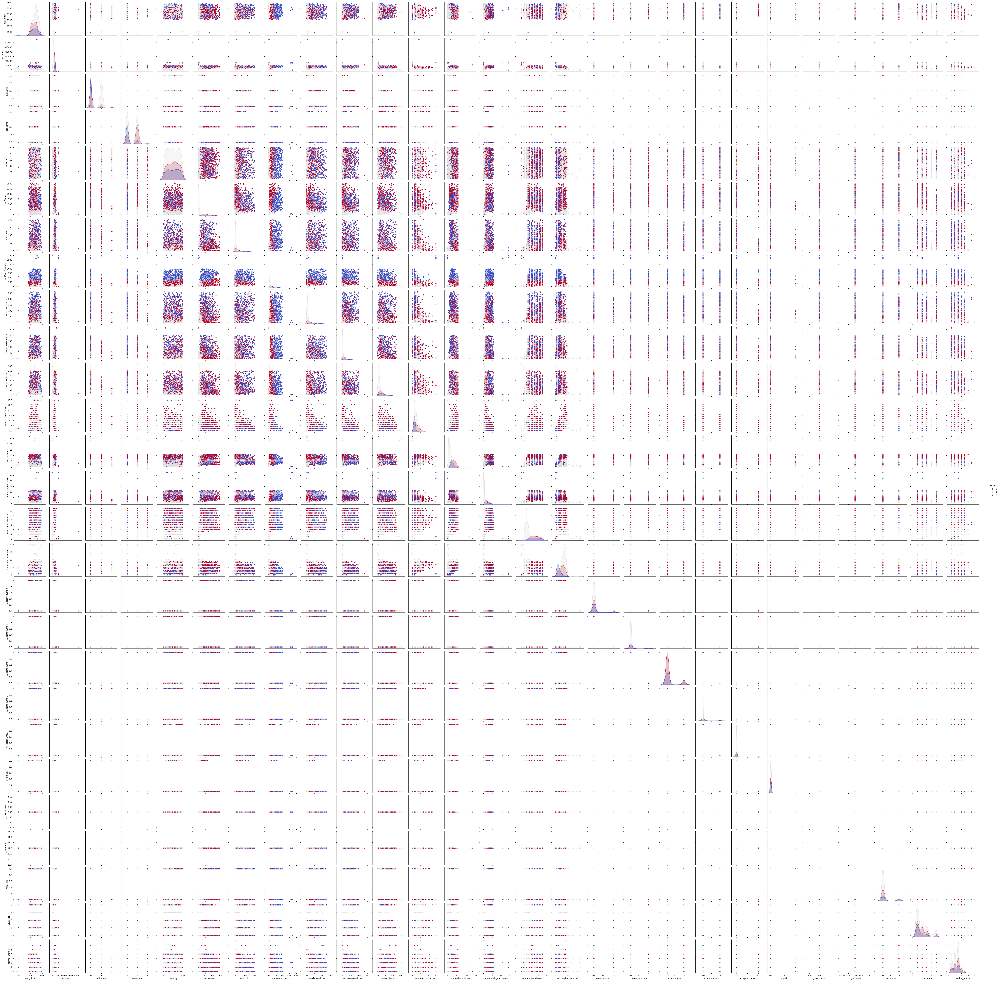

In [241]:
sns.pairplot(data = df_mar_original[['Year_Birth', 'Income', 'Kidhome', 'Teenhome', 'Recency',
       'MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts',
       'MntSweetProducts', 'MntGoldProds', 'NumDealsPurchases',
       'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases',
       'NumWebVisitsMonth', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5',
       'AcceptedCmp1', 'AcceptedCmp2', 'Complain', 'Z_CostContact',
       'Z_Revenue', 'Response', 'Education', 'Marital_Status','hc_pca']], hue='hc_pca', palette='coolwarm')